In [89]:
import waipy
import iris
import numpy as np
from pylab import *
from waipy import *
from numpy import genfromtxt
import collections
from scipy.stats import norm
from scipy import signal
import iris.coord_categorisation as coord_cat
import iris.quickplot as qplt
import pickle
###stick with UKESM1 data for now, 1000 years
#


In [2]:
def correct_nov_year(SSW_year, SSW_month):
	SSW_year2 = SSW_year[:]
	for i in range(len(SSW_year)):
		if SSW_month[i] == 'Nov':
			SSW_year2[i] += 1

	return SSW_year2

#load cube of U fields, GC3 and ERA observation data.
def callback(cube, field, filename): 
    del cube.attributes['history']

#contrain latitudes
def correct_lat(cell):
	return -5.1 < cell < 5.1
lat_constraint = iris.Constraint(latitude = correct_lat)

#add month, season and year metadata
def add_times(cube, time):
	coord_cat.add_month(cube, time, name='month')
	coord_cat.add_season(cube, time, name='clim_season')
	coord_cat.add_year(cube, time, name='year')
	coord_cat.add_day_of_year(cube, time, name='day_number')
	coord_cat.add_season_year(cube, time, name='season_year')

	return cube
def get_coord_from_list(List, coord_name):
	coord = []
	
	for i in range(len(List)):
		coord.append(List[i].coord(coord_name).points[0])
	
	return coord

## iris list of SSW events
SSW_UKESM = iris.load('SSW_UKESM_cube.nc')[0]
SSW_UKESM_DJFM = SSW_UKESM.extract(iris.Constraint(month = ['Dec','Jan','Feb','Mar']))
SSW_UKESM_Novs = SSW_UKESM.extract(iris.Constraint(month = ['Nov']))
print(len(SSW_UKESM_Novs.coord('year').points))
print(np.sum(np.isin(SSW_UKESM_Novs.coord('year').points+1, SSW_UKESM_DJFM.coord('year').points)))





## get years and months out of list
SSW_UKESM_month = SSW_UKESM.coord('month').points[np.argsort(SSW_UKESM.coord('year').points)]
SSW_UKESM_year = np.sort(SSW_UKESM.coord('year').points)#get_coord_from_list(SSW_UKESM_list, 'season_year')
SSW_UKESM_year = correct_nov_year(SSW_UKESM_year, SSW_UKESM_year)
SSW_UKESM_yearDJFM = np.sort(SSW_UKESM_DJFM.coord('year').points)#get_coord_from_list(SSW_UKESM_list, 'season_year')
#count SSWs in each year
count = collections.Counter(SSW_UKESM_year)
countDJFM = collections.Counter(SSW_UKESM_yearDJFM)
##year list
UKESM_years = np.arange(2060,3061,1)
##make SSW time series
SSW_UKESM,SSW_UKESM_DJFM,SSW_UKESM_DJFM_series = [],[],[]
for i in UKESM_years:
	SSW_UKESM.append(count[i])
	SSW_UKESM_DJFM_series.append(countDJFM[i])
SSW_UKESM_DJFM_series = np.array(SSW_UKESM_DJFM_series)
SSW_UKESM_DJFM_series[SSW_UKESM_DJFM_series>2] = 2
SSW_UKESM = np.array(SSW_UKESM)
SSW_UKESM[SSW_UKESM>2] = 2

print(len(SSW_UKESM_DJFM_series))
UKESM_DJFM_decadal = []
QBO_decadal = []
## decadal smoothing if necessary

109
57
1001


In [133]:
HT_10 = iris.load('HT_series_UKESM_10yrs_correlations.nc')[0].data


pre = './ZMZW_monthly'
fname = pre + '/UKESM*.nc' #sys.argv[2]#
cubes = iris.load(fname, lat_constraint, callback=callback)
cubes_new = iris.cube.CubeList([cubes[1], cubes[0][492:]])
U_UK = cubes_new.concatenate()[0]
U_UK = add_times(U_UK, 'time')
U_UK = U_UK.collapsed(['longitude','latitude'], iris.analysis.MEAN)
QBO_50 = U_UK.extract(iris.Constraint(air_pressure = 50)).extract(iris.Constraint(month = ['Sep','Oct','Nov']))
QBO_50 = QBO_50.aggregated_by('year', iris.analysis.MEAN)

QBO_deep = iris.load('deep_QBO_mean_15-30hPa.nc')
QBO_deep = QBO_deep[0].extract(iris.Constraint(month = ['Sep','Oct','Nov'])).aggregated_by('year', iris.analysis.MEAN)
QBO_deep_amplitude_mod = iris.load('QBO_deep_amplitude_modulation_15-30_new.nc')[0].data

#HT_deep = iris.load('HT_series_UKESM_deep_correlations.nc')[0].data

### read in AMV index for 
AMV_DJF = iris.load('AMO_UK_DJF.nc')[0].data
AMV = iris.load('AMO_UK.nc')[0].data

##PDO data
PDO_UK_all = iris.load('PDO_UK_NDJF.nc')[0]
PDO_UK_all_SON = iris.load('PDO_UK_SON.nc')[0]

PDO_UK_NDJF = PDO_UK_all.extract(iris.Constraint(month = ['Nov','Dec','Jan','Feb']))
PDO_UK_N = PDO_UK_all.extract(iris.Constraint(month = 'Nov'))
PDO_UK_N = PDO_UK_N.aggregated_by('year', iris.analysis.MEAN).data
PDO_UK = PDO_UK_NDJF.aggregated_by('season_year', iris.analysis.MEAN)[0:-1].data
PDO_UK_SON = PDO_UK_all_SON.extract(iris.Constraint(month = ['Sep' 'Oct', 'Nov']))
PDO_UK_SON = PDO_UK_SON.aggregated_by('year', iris.analysis.MEAN).data

#equatorial upwelling, Wstar
Wstar = add_times(iris.load('Wstar.nc', lat_constraint,)[0], 't')
Wstar = Wstar[np.argsort(Wstar.coord('t').points)].collapsed(['longitude','latitude'], iris.analysis.MEAN).extract(iris.Constraint(month = ['Sep' 'Oct', 'Nov']))
Wstar = Wstar.extract(iris.Constraint(Pressure = 30)).data


Ocean_Flux_PC1 = iris.load('ocean_heat_flux_PC1_NA_winter.nc')[0]
Ocean_Flux_PC1 = Ocean_Flux_PC1.data[0:-1]

Ocean_Flux_PC3 = iris.load('ocean_heat_flux_PC3_NA_winter.nc')[0]
Ocean_Flux_PC3 = -1*Ocean_Flux_PC3.data[0:-1]
Ocean_Flux_PC2_3 = iris.load('ocean_heat_flux_PC2_and_3_NA_winter.nc')[0]
Ocean_Flux_PC2_3 = Ocean_Flux_PC2_3.data[0:-1]
Ocean_Flux_lab_sea = iris.load('Flux_Labrador_sea.nc')[0]
Ocean_Flux_lab_sea = -1*Ocean_Flux_lab_sea.data[0:-1]
Ocean_Flux_gulf = iris.load('Flux_mexican_gulf_sea.nc')[0]
Ocean_Flux_gulf = -1*Ocean_Flux_gulf.data[0:-1]

HT_cors = pickle.load( open( "HT_correlations.p", "rb" ) )
OLR = iris.load('tropical_OLR_sep_nov.nc')[0].data

U_piclim = iris.load('ua_AERmonZ_UKESM1-0-LL_piClim-control_r1i1p1f4_gnz_185001-189412.nc')[0]
U_piclim = U_piclim.extract(lat_constraint).collapsed('latitude', iris.analysis.MEAN)[:,19].data

/Users/oscardimdore-miles/opt/anaconda3/envs/virtual_env/lib/python3.8/site-packages/iris/cube.py:3218: UserWarning: Collapsing spatial coordinate 'latitude' without weighting
  warnings.warn(msg.format(coord.name()))
/Users/oscardimdore-miles/opt/anaconda3/envs/virtual_env/lib/python3.8/site-packages/iris/coords.py:1410: UserWarning: Collapsing a non-contiguous coordinate. Metadata may not be fully descriptive for 'latitude'.
  warnings.warn(msg.format(self.name()))
/Users/oscardimdore-miles/opt/anaconda3/envs/virtual_env/lib/python3.8/site-packages/iris/coords.py:1410: UserWarning: Collapsing a non-contiguous coordinate. Metadata may not be fully descriptive for 'longitude'.
  warnings.warn(msg.format(self.name()))
/Users/oscardimdore-miles/opt/anaconda3/envs/virtual_env/lib/python3.8/site-packages/iris/fileformats/_pyke_rules/compiled_krb/fc_rules_cf_fc.py:2341: UserWarning: Failed to create 't' dimension coordinate: The 't' DimCoord points array must be strictly monotonic.
Graceful

In [326]:
import scipy
AMOC = iris.load('AMOC_45N_mass_SF.nc')[0].aggregated_by('year', iris.analysis.MEAN)[100:].data
print(AMOC.shape)
AMOC_50 = iris.load('AMOC_annual_mean_50N_mass_SF.nc')[0].data
NAM = iris.load('./NAM_10hPa_Dec_Mar_mean.nc')[0].data[10:]
NAM_filtered = iris.load('./NAM_10hPa_2yr_gaussian_filtered.nc')[0].data[10:-1]
print(NAM_filtered.shape)
Ocean_Flux_lab_sea = iris.load('Flux_Labrador_sea.nc')[0]
flux_lab_sea = scipy.ndimage.gaussian_filter1d(-1*Ocean_Flux_lab_sea.data[0:-1], 2)
print(Ocean_Flux_gulf.shape)
### DJFM NAO index
NAO = iris.load('NAO_PC_UKESM.nc')[0].extract(iris.Constraint(month = ['Dec','Jan','Feb','Mar']))
NAO = NAO.aggregated_by('season_year', iris.analysis.MEAN).extract(iris.Constraint(year = np.arange(2060,3059,1))).data
Ice_lab =  scipy.ndimage.gaussian_filter1d(iris.load('Seas_ice_frac_lab_sea.nc')[0].data, 2)[0:-1]
print(Ice_lab.shape)
AMV_DJF = iris.load('NA_SSTs.nc')[0].data[0:-1]
Ocean_Flux_PC2 = iris.load('ocean_heat_flux_PC2_NA_winter.nc')[0]
Ocean_Flux_PC2 = scipy.ndimage.gaussian_filter1d(-1*Ocean_Flux_PC2.data[1:-1], 2)

Ocean_Flux_PC1 = iris.load('ocean_heat_flux_PC1_NA_winter.nc')[0]
Ocean_Flux_PC1 = scipy.ndimage.gaussian_filter1d(-1*Ocean_Flux_PC1.data[1:-1], 2)
print(AMV_DJF.shape)
SST_reichler = iris.load('SST_reichler_box.nc')[0].data[0:-1]


(1000,)
(1000,)
(1000,)
(1000,)
(1000,)


In [165]:
SST_lab = iris.load('SST_lab_sea.nc')[0].data
Ice_NP = iris.load('Sea_ice_frac_NP.nc')[0].data
SLP_iceland = iris.load('Iceland_SLP_anom_DJFM.nc')[0].data

SST_TEP = iris.load('SST_TEP_sea.nc')[0].data
SST_TWP = iris.load('SST_TWP_sea.nc')[0].data
SST_TA = iris.load('SST_TA_sea.nc')[0].data
SST_TIO = iris.load('SST_TIO_sea.nc')[0].data
ENSO = iris.load('ENSO3.4.nc')[0].data
ENSO_SON = iris.load('ENSO3.4_SON.nc')[0].data
AMOC_ROC = np.gradient(np.array(AMOC))
#AL index
AL = iris.load('AL_PC_DJFM_UKESM.nc')[0].extract(iris.Constraint(month = ['Dec', 'Jan', 'Feb','Mar']))
AL = AL.aggregated_by('season_year', iris.analysis.MEAN).extract(iris.Constraint(year = np.arange(2060,3061,1))).data
AL_cohen = iris.load('SLP_anom_cohen_box.nc')[0].extract(iris.Constraint(year = np.arange(2060,3061,1))).data

In [11]:
#UKESM ZMZW data
pre = './ZMZW_monthly'
fname = pre + '/UKESM*.nc' #sys.argv[2]#
cubes = iris.load(fname, callback=callback)
cubes_new = iris.cube.CubeList([cubes[1], cubes[0][492:]])
U_UK = cubes_new.concatenate()[0]
U_UK = add_times(U_UK, 'time')
U_UK = U_UK.collapsed(['longitude'], iris.analysis.MEAN).extract(iris.Constraint(month = ['Dec','Jan','Feb','Mar'])).aggregated_by('season_year', iris.analysis.MEAN)
U = U_UK.extract(iris.Constraint(latitude = 60))
U = U.extract(iris.Constraint(air_pressure = 10))


/Users/oscardimdore-miles/opt/anaconda3/envs/virtual_env/lib/python3.8/site-packages/iris/coords.py:1410: UserWarning: Collapsing a non-contiguous coordinate. Metadata may not be fully descriptive for 'longitude'.
  warnings.warn(msg.format(self.name()))


In [21]:

print(U.coord('season_year').points, AL_cohen.shape)
print(np.corrcoef(AL_cohen, U.data))
print(np.corrcoef(AL, U.data))

[2060 2061 2062 ... 3059 3060 3061] (1002,)
[[1.         0.16513221]
 [0.16513221 1.        ]]
[[1.         0.33837597]
 [0.33837597 1.        ]]


In [24]:
##decadal smoothing
SLP_iceland_decadal, OLR_decadal, AL_cohen_decadal, UKESM_decadal, ENSO_decadal, ENSO_SON_decadal, Wstar_decadal, AMOC_50_decadal, AMOC_ROC_decadal, SST_TIO_decadal, SST_TA_decadal, SST_TEP_decadal, SST_TWP_decadal, UKESM_NDJFM_decadal, AMOC_decadal, flux_pc2_decadal, flux_pc3_decadal, flux_pc1_decadal, Ice_lab_decadal, Ice_NP_decadal, SST_lab_decadal, QBO_deep_amplitude_mod_decadal, flux_pc_reg_decadal, flux_pc2_3_decadal, PDO_UK_SON_decadal, AMV_UK_DJF_decadal, ENSO_SON_decadal, QBO_SON_decadal, NAO_decadal, AL_decadal, flux_lab_sea_decadal, flux_gulf_decadal  = [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []
for i in range(0, len(UKESM_years) - 5, 1):
	PDO_UK_SON_decadal.append(np.mean(PDO_UK_SON[i:i+5]))
	AMV_UK_DJF_decadal.append(np.mean(AMV_DJF[i:i+5]))
	NAO_decadal.append(np.mean(NAO[i:i+5]))
	AL_decadal.append(np.mean(AL[i:i+5]))
	AL_cohen_decadal.append(np.mean(AL_cohen[i:i+5]))
	AMOC_decadal.append(np.mean(AMOC[i:i+5]))
	AMOC_50_decadal.append(np.mean(AMOC_50[i:i+5]))
	AMOC_ROC_decadal.append(np.mean(AMOC_ROC[i:i+5]))
	flux_pc2_decadal.append(mean(Ocean_Flux_PC2[i:i+5]))
	flux_pc1_decadal.append(mean(Ocean_Flux_PC1[i:i+5]))
	flux_pc3_decadal.append(mean(Ocean_Flux_PC3[i:i+5]))
	flux_pc2_3_decadal.append(mean(Ocean_Flux_PC2_3[i:i+5]))
	flux_pc_reg_decadal.append(mean(Flux_PC_reg[i:i+5]))
	flux_lab_sea_decadal.append(mean(Ocean_Flux_lab_sea[i:i+5]))
	flux_gulf_decadal.append(mean(Ocean_Flux_gulf[i:i+5]))
	SST_lab_decadal.append(mean(SST_lab[i:i+5]))
	SST_TWP_decadal.append(mean(SST_TWP[i:i+5]))
	SST_TEP_decadal.append(mean(SST_TEP[i:i+5]))
	SST_TA_decadal.append(mean(SST_TA[i:i+5]))
	SST_TIO_decadal.append(mean(SST_TIO[i:i+5]))
	ENSO_decadal.append(mean(ENSO[i:i+5]))
	ENSO_SON_decadal.append(mean(ENSO_SON[i:i+5]))
	Ice_lab_decadal.append(mean(Ice_lab[i:i+5]))
	Ice_NP_decadal.append(mean(Ice_NP[i:i+5]))
	UKESM_NDJFM_decadal.append(mean(SSW_UKESM[i:i+5]))
	Wstar_decadal.append(mean(Wstar[i:i+5]))
	UKESM_DJFM_decadal.append(mean(SSW_UKESM_DJFM_series[i:i+5]))
	UKESM_decadal.append(mean(SSW_UKESM[i:i+5]))
	QBO_deep_amplitude_mod_decadal.append(np.mean(QBO_deep_amplitude_mod[i:i+5]))
	OLR_decadal.append(np.mean(OLR[i:i+5]))
	SLP_iceland_decadal.append(np.mean(SLP_iceland[i:i+5]))

NAO_lows = np.array(NAO_decadal).copy()
NAO_lows[NAO_decadal > np.mean(np.array(NAO_decadal))] = np.mean(np.array(NAO_decadal))
UKESM_DJFM_decadal = np.array(UKESM_DJFM_decadal)
UKESM_NDJFM_decadal = np.array(UKESM_NDJFM_decadal)
flux_lab_sea_decadal_ROC = np.gradient(flux_lab_sea_decadal)

In [8]:
print(np.corrcoef(AL_cohen_decadal, UKESM_DJFM_decadal))
print(np.corrcoef(AL_decadal, UKESM_DJFM_decadal))

[[ 1.         -0.12231585]
 [-0.12231585  1.        ]]
[[ 1.         -0.17090598]
 [-0.17090598  1.        ]]


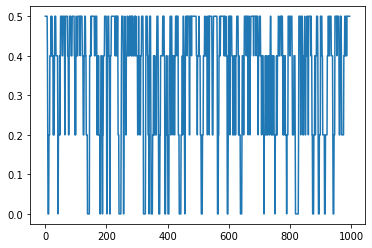

0.40674081816834506
512 512
0.40701077550279635
512 512
0.3950845335249553
512 512
0.29069883104913774
512 512
-0.020143049028194426
512 512
-0.003749173670790321
512 512
0.6137530808303892
512 512
0.0447549136882214
512 512
0.47595585937631024
512 512
1001
0.7384240802931861
512 512
0.6134680543562558
512 512
0.6722045135565468
512 512
-0.3810480028532654
512 512
-0.42268388940182416
512 512
0.08327196414517105
512 512
0.6342507814249012
512 512
0.9666122097548464
512 512
0.7983978146899804
512 512
0.7054621615270188
512 512
0.5909435759286245
512 512
0.28021489371089187
512 512
-0.002293192137400192
512 512
0.8180090287541172
512 512
0.0035847483633464614
512 512
-0.03976938617744123
512 512
0.7590404686353471
512 512
0.5775256606268827
512 512
0.813066236105467
512 512
0.9204959150963286
512 512
-0.43413903681065946
512 512
(1000,)
0.7621785051197274
512 512
0.5009578670921303
512 512
0.5505547417057708
512 512
-0.02482384885004129
512 512
0.5724600944928673
512 512
-0.0592339371840

In [327]:
def get_result(data, lag, distinct_decadal_smooth = False):
	data_norm = normalize(data)
	var = np.var(data_norm)
	alpha = np.corrcoef(data_norm[0:-1*lag], data_norm[lag:])[0,1]
	print(alpha)
	if distinct_decadal_smooth == False:
		dt = 1
	else:
		dt = 10
	result = cwt(data_norm, dt, 1, 0.25, 0.5, 7/0.5, alpha, 6, mother='Morlet', name='x')
	return result, data_norm

#UKESM SSWs per year data
SSW_decadal_low_var = UKESM_DJFM_decadal.copy()
SSW_decadal_low_var[SSW_decadal_low_var>0.5] = 0.5
SSW_decadal_high_var = UKESM_DJFM_decadal.copy()
SSW_decadal_high_var[SSW_decadal_high_var<0.5] = 0.5

SSW_low_var = SSW_UKESM_DJFM_series.copy()

plt.plot(np.arange(996), SSW_decadal_low_var)
plt.show()

result_SSW_UKESM_DJFM_decadal, data_norm_UKESM_DJFM_decadal = get_result(UKESM_DJFM_decadal, 3)
result_SSW_UKESM_NDJFM_decadal, data_norm_UKESM_NDJFM_decadal = get_result(UKESM_NDJFM_decadal, 3)
result_SSW_UKESM_DJFM_decadal_lows, data_norm_UKESM_DJFM_decadal_lows = get_result(SSW_decadal_low_var, 3)
result_SSW_UKESM_DJFM_decadal_highs, data_norm_UKESM_DJFM_decadal_highs = get_result(SSW_decadal_high_var, 3)

result_SSW_UKESM_DJFM, data_norm_UKESM_DJFM = get_result(SSW_UKESM_DJFM_series, 3)
result_SSW_UKESM_NDJFM, data_norm_UKESM_NDJFM = get_result(SSW_UKESM, 3)
result_NAM_filtered, data_norm_NAM_filtered = get_result(NAM_filtered, 3)
result_NAM, data_norm_NAM = get_result(NAM, 3)
result_SST_reichler, data_norm_SST_reichler = get_result(SST_reichler, 2)


print(len(SSW_UKESM_DJFM_series))
#other data: AMV and QBO index, to add ENSO index later
result_HT_10, data_norm_HT_10 = get_result(HT_10, 2)
result_AMV, data_norm_AMV = get_result(AMV_DJF, 1)
result_PDO_SON_decadal, data_norm_PDO_SON_decadal = get_result(PDO_UK_SON_decadal, 2)
result_QBO_50, data_norm_QBO_50 = get_result(QBO_50.data, 1)
result_QBO_deep, data_norm_QBO_deep = get_result(QBO_deep.data, 1)
result_QBO_deep_amp, data_norm_QBO_deep_amp = get_result(QBO_deep_amplitude_mod, 1)
result_QBO_deep_amp_decadal, data_norm_QBO_deep_amp_decadal = get_result(QBO_deep_amplitude_mod_decadal, 2)
result_QBO_piclim, data_norm_QBO_piclim = get_result(U_piclim, 1)
result_SLP_iceland, data_norm_SLP_iceland = get_result(SLP_iceland_decadal, 1)

#result_HT_deep, data_norm_HT_deep = get_result(HT_deep, 4)
result_Wstar_decadal, data_norm_Wstar_decadal = get_result(Wstar_decadal, 3)
result_NAO_decadal, data_norm_NAO_decadal = get_result(NAO_decadal, 2)
result_NAO_low, data_norm_NAO_low = get_result(NAO_lows, 3)
result_NAO, data_norm_NAO = get_result(NAO, 2)
result_OLR_decadal, data_norm_OLR_decadal = get_result(OLR_decadal, 1)
result_OLR, data_norm_OLR = get_result(OLR, 1)

result_AL, data_norm_AL = get_result(AL, 1)
result_AL_decadal, data_norm_AL_decadal = get_result(AL_decadal, 1)
result_AMOC, data_norm_AMOC = get_result(AMOC, 1)
result_AMOC_decadal, data_norm_AMOC_decadal = get_result(AMOC_decadal, 2)
result_AMOC_50_decadal, data_norm_AMOC_50_decadal = get_result(AMOC_50_decadal, 1)
result_AMOC_decadal_ROC, data_norm_AMOC_decadal_ROC = get_result(AMOC_ROC_decadal, 5)

print(Ocean_Flux_PC2.shape)
result_flux_PC2, data_norm_flux_PC2 = get_result(Ocean_Flux_PC2, 2)
result_flux_PC2_decadal, data_norm_flux_PC2_decadal = get_result(flux_pc2_decadal, 2)
result_flux_PC1, data_norm_flux_PC1 = get_result(Ocean_Flux_PC1, 3)

result_flux_PC3, data_norm_flux_PC3 = get_result(Ocean_Flux_PC3, 2)
result_flux_PC3_decadal, data_norm_flux_PC3_decadal = get_result(flux_pc3_decadal, 2)
result_flux_PC2_3, data_norm_flux_PC2_3 = get_result(Ocean_Flux_PC2_3, 2)
result_flux_PC2_3_decadal, data_norm_flux_PC2_3_decadal = get_result(flux_pc2_3_decadal, 2)
result_flux_PC_reg, data_norm_flux_PC_reg = get_result(Flux_PC_reg, 2)
result_flux_PC_reg_decadal, data_norm_flux_PC_reg_decadal = get_result(flux_pc_reg_decadal, 3)
result_flux_lab_sea_decadal, data_norm_flux_lab_sea_decadal = get_result(flux_lab_sea_decadal, 2)
result_flux_lab_sea_decadal_ROC, data_norm_flux_lab_sea_decadal_ROC = get_result(flux_lab_sea_decadal_ROC, 5)
result_flux_lab_sea, data_norm_flux_lab_sea = get_result(flux_lab_sea, 2)

result_flux_gulf_decadal, data_norm_flux_gulf_decadal = get_result(flux_gulf_decadal, 3)
result_SST_lab, data_norm_SST_lab = get_result(SST_lab_decadal, 3)
result_Ice_lab, data_norm_Ice_lab = get_result(Ice_lab, 3)
result_Ice_NP, data_norm_Ice_NP = get_result(Ice_NP_decadal, 3)

result_SST_TWP, data_norm_SST_TWP = get_result(SST_TWP_decadal, 2)
result_SST_TEP, data_norm_SST_TEP = get_result(SST_TEP_decadal, 2)
result_SST_TA, data_norm_SST_TA = get_result(SST_TA_decadal, 2)
result_SST_TIO, data_norm_SST_TIO = get_result(SST_TIO_decadal, 2)
result_ENSO, data_norm_ENSO = get_result(ENSO_decadal, 1)
result_ENSO_SON_decadal, data_norm_ENSO_SON_decadal = get_result(ENSO_SON_decadal, 1)
result_ENSO_SON, data_norm_ENSO_SON = get_result(ENSO_SON, 1)

QBO_test = result_QBO_50['power'][10,:]
result_QBO_test, data_norm_QBO_test = get_result(QBO_test, 10)

result_HT_cors = [get_result(HT_cors[i][0:-1], 2)[0] for i in range(len(HT_cors))]
data_norm_HT_cors = [get_result(HT_cors[i][0:-1], 2)[1] for i in range(len(HT_cors))]



#result_HTQBO, data_norm_HTQBO = get_result(HTQBO, 1)

In [100]:
extra_sig = result_SSW_UKESM_DJFM_decadal['sig95']
def wavelet_plot(var, time, data, dtmin, result, axis_name, filename, start_year, data_type):#, t_sig, s_sig):
    """
    PLOT WAVELET TRANSFORM
    var = title name from data
    time  = vector get in load function
    data  = from normalize function
    dtmin = minimum resolution :1 octave
    result = dict from cwt function
    """
    from numpy import log2
    import numpy as np
    #import wavetest
    import matplotlib
    import matplotlib.gridspec as gridspec

    # frequency limit
    # print result['period']
    # lim = np.where(result['period'] == result['period'][-1]/2)[0][0]
    """Plot time series """

    fig = plt.figure(figsize=(12, 8), dpi=80)

    smoothed_NAM_events = pickle.load(open('./NAMs/NAM_smoothed_events_for_plotting', 'rb'))
    strongs = smoothed_NAM_events[0]
    weaks = smoothed_NAM_events[1]

    gs1 = gridspec.GridSpec(4, 3)
    gs1.update(left=0.05, top = 0.9, right=0.7, wspace=0.3, hspace=0)
    ax1 = plt.subplot(gs1[0, :])
    ax1.xaxis.set_visible(False)
    plt.setp(ax1.get_xticklabels(), visible=False)
    ax2 = plt.subplot(gs1[1:4, :])#, axisbg='#C0C0C0')

    gs2 = gridspec.GridSpec(4, 1)
    gs2.update(left=0.7, right=0.95, hspace=0)
    ax5 = plt.subplot(gs2[1:4, 0], sharey=ax2)
    plt.setp(ax5.get_yticklabels(), visible=True)

    gs3 = gridspec.GridSpec(6, 1)
    gs3.update(left=0.77, top=0.88, right=0.98, hspace=0.3, wspace=0.01)
    ax3 = plt.subplot(gs3[0, 0])

    # ----------------------------------------------------------------------------------------------------------------#
    if data_type == 'SSW':
        ax1.bar(time, data)
        ax1.set_yticks([0,1,2])
    else:
        ax1.plot(time, data)
        ax1.scatter(np.array(strongs) - 2060, np.ones(len(strongs)), color = 'r', s =2)
        ax1.scatter(np.array(weaks) - 2060, -1*np.ones(len(weaks)), color = 'b', s = 2)
    ax1.axis('tight')
    ax1.set_ylabel(axis_name)
    ax1.set_title('%s' % var)
    #ax1.yaxis.set_major_locator(MaxNLocator(prune='lower'))
    #ax1.grid(True)
    ax1.xaxis.set_visible(False)
    ax1.set_xlim(time[0], time[-1]+1)
    # ----------------------------------------------------------------------------------------------------------------#
    ax3.plot(arange(-result['nw'] / 2, result['nw'] / 2),result['joint_wavelet'], 'k', label='Real part')
    ax3.plot(arange(-result['nw'] / 2, result['nw'] / 2),result['imag_wavelet'], '--k', label='Imag part')
    ax3.plot(arange(-result['nw'] / 2, result['nw'] / 2),result['mean_wavelet'], 'g', label='Mean')
    # ax3.axis('tight')
    ax3.set_xlim(-40, 40)
    # ax3.set_ylim(-0.3,0.3)
    # ax3.set_ylim([np.min(result['joint_wavelet']),np.max(result['joint_wavelet'])])
    ax3.set_xlabel('Time (days)', fontsize=10)
    ax3.set_ylabel('Amplitude', fontsize=10)
    ax3.set_title('$\psi$ (t/s) {0} in time domain'.format(result['mother']))
    # ----------------------------------------------------------------------------------------------------------------#
    # ax4.plot(result['ondaleta'],'k')
    # ax4.set_xlabel('Frequency', fontsize=10)
    # ax4.set_ylabel('Amplitude', fontsize=10)
    # ax4.set_title('$\psi^-$  Frequency domain', fontsize=13)
    # ----------------------------------------------------------------------------------------------------------------#
    """ Contour plot wavelet power spectrum """
    #lev = np.arange(15)#np.min(result['power']), np.max(result['power']))

    pc = ax2.contourf(time, np.log2(result['period']), result['power'], master_levels, cmap = 'Reds')
    pc2 = ax2.contour(time, np.log2(result['period']), result['sig95'],[-99, 1], linewidths=2)
    #pc3 = ax2.contour(time, np.log2(result['period']), result_SSW_UKESM_DJFM_decadal['sig95'],[-99, 1], linewidths=2, colors = 'greenyellow')

    extra_sig = result_SSW_UKESM_DJFM_decadal['sig95']
    #ax2.contour(time, np.log2(result['period']), extra_sig,[-99, 1], linewidths=2, colors = 'greenyellow')
    #ax2.plot(time, np.log2(result['coi']), 'k')
    # cone-of-influence , anything "below"is dubious
    ax2.fill_between(time, np.log2(result['coi']), int(np.log2(result['period'][-1]) + 1), alpha=0.5, hatch='/')
    position = fig.add_axes([0.07, 0.05, 0.6, 0.01])
    cbar = plt.colorbar(pc, cax=position, orientation='horizontal')
    cbar.set_label('Power')
    yt = (np.log2(result['period']))
    yt = range(int(np.log2(result['period'][0])), int(
        np.log2(result['period'][-1]) + 1))# create the vector of periods
    Yticks = [float(math.pow(2, p)) for p in yt]# make 2^periods
    Yticks = [int(i) for i in Yticks]
    ax2.set_yticks(yt)
    ax2.set_yticklabels(Yticks)
    ax2.set_ylim(ymin=(np.log2(result['period'][i1])), ymax=(
        np.log2(result['period'][i2])))
    ax2.invert_yaxis()
    ax2.set_xlabel('Year Number', fontsize=13)
    ax2.set_ylabel('Period (years)', fontsize=13)
    # ----------------------------------------------------------------------------------------------------------------#
    """ Plot global wavelet spectrum """
    #f, sxx = fft(data)
    #ax5.plot(sxx, np.log2(1 / f * result['dt']), 'gray', label='Fourier spectrum')
    ax5.plot(result['global_ws'], np.log2(result['period']), 'b', label='Wavelet spectrum')
    ax5.plot(np.array(result['global_signif'])/1, np.log2(result['period']), 'r--', label='95% confidence spectrum')
    ax5.legend(loc=0)
    #ax5.set_yticks(yt[1:])
    ax5.yaxis.tick_right()
    ax5.yaxis.set_label_position("right")

    ax5.set_xlim(0, 1.05 * np.max(result['global_ws']))
    ax5.set_xticks(np.arange(0, int(1.05 * np.max(result['global_ws'])), 5))
    ax5.set_xlabel('Power', fontsize=10)
    ax5.set_ylabel('Period (years)', fontsize=10)

    ax5.set_title('Global Wavelet Spectrum', fontsize=12)
    #ax5.set_xlim(0,11)
    # save fig
    plt.tight_layout()
    fig.subplots_adjust(left = 0.5)
    plt.show()
    fig.savefig(filename, dpi=180)

/Users/oscardimdore-miles/opt/anaconda3/envs/virtual_env/lib/python3.8/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
<ipython-input-100-05a2cba567a6>:122: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


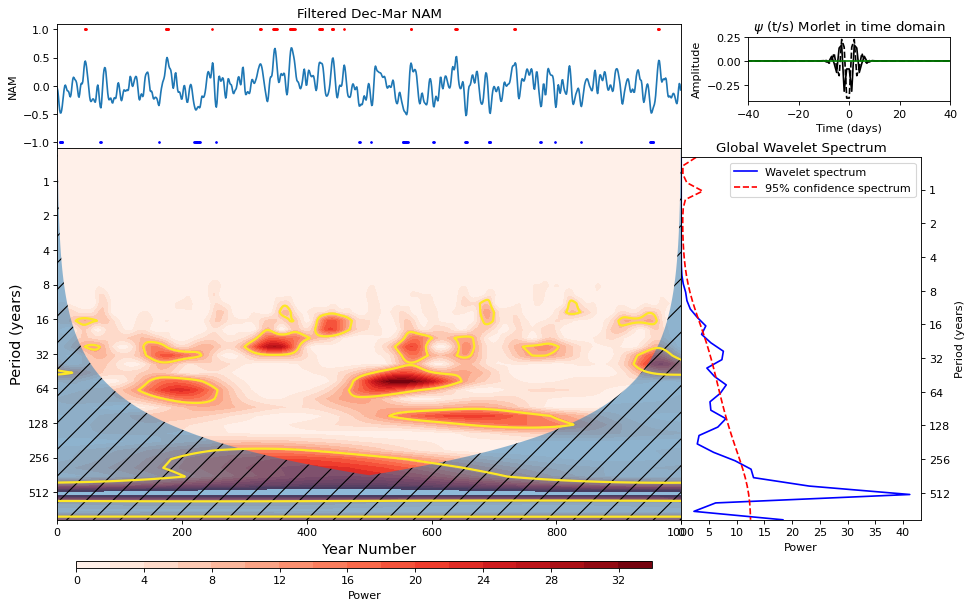

In [101]:
def main(data, data_norm, result, title, axis_name, filename, start_year, data_type, dt):#, t_sig, s_sig):
	z = np.linspace(0,len(data_norm)*dt, len(data_norm))
	wavelet_plot(title, z, data, 0.03125, result, axis_name, filename, start_year, data_type)#, t_sig, s_sig)
	return result

i1 = 0
i2 = -1

#result_UKESM_SSW = main(UKESM_DJFM_decadal, data_norm_UKESM_DJFM_decadal, result_SSW_UKESM_DJFM_decadal, '$SSW_{5yr}$', 'events/season', './Multi_decada_paper_figs/SSW_wavelet_5_yr_fig3_new_levels.png', 0, 'other', 1)
#result_UKESM_SSW_NDJFM = main(UKESM_NDJFM_decadal, data_norm_UKESM_NDJFM_decadal, result_SSW_UKESM_NDJFM_decadal, 'Nov-Mar $SSW_{5yr}$', 'events/season', './Multi_decada_paper_figs/SSW_wavelet_5_yr_fig3_new_levels_NDJFM.png', 0, 'other', 1)

#result_UKESM_SSW_2 = main(SSW_UKESM_DJFM_series, SSW_UKESM_DJFM_series, result_SSW_UKESM_DJFM, 'SSWs per season', 'events/season', './Multi_decada_paper_figs/SSW_wavelet_new_levels.png', 0, 'SSW', 1)
#result_ENSO = main(ENSO_SON, data_norm_ENSO_SON, result_ENSO_SON, 'ENSO3.4', 'ENSO (K)', './Multi_decada_paper_figs/ENSO_wavelet_new_levels.png', 0, 'other', 1)

#master_levels = np.arange(0,65,5)
#dummy = main(AMOC_decadal, data_norm_AMOC_decadal, result_AMOC_decadal, '5 year mean AMOC index (30N)', 'AMOC', 'AMOC_5yr_window_wavelet_UKESM.png', 2060, 'NAM', 1)
master_levels = np.arange(0,36,2)
dummy = main(NAM_filtered, data_norm_NAM_filtered, result_NAM_filtered, 'Filtered Dec-Mar NAM', 'NAM', 'NAM_wavelet_UKESM.png', 2060, 'NAM', 1)

master_levels = np.arange(0,32,2)
#dummy = main(AMOC, data_norm_AMOC, result_AMOC, 'AMOC index (30N)', 'AMOC', 'AMOC_wavelet_UKESM.png', 2060, 'NAM', 1)
#dummy = main(OLR_decadal, data_norm_OLR_decadal, result_OLR_decadal, 'equatorial OLR', 'OLR', 'OLR_wavelet_UKESM.png', 2060, 'NAM', 1)
#dummy = main(OLR, data_norm_OLR, result_OLR, 'equatorial OLR', 'OLR', 'OLR_wavelet_UKESM.png', 2060, 'NAM', 1)
#dummy = main(Wstar_decadal, data_norm_Wstar_decadal, result_Wstar_decadal, 'equatorial [{W^*}]', '[{W^*}]', 'Wstar_wavelet_UKESM.png', 2060, 'NAM', 1)

#result_UKESM_SSW = main(SSW_decadal_low_var, data_norm_UKESM_DJFM_decadal_lows, result_SSW_UKESM_DJFM_decadal_lows, 'DJFM SSW rate (5 year window, high SSW rate variability removed)', 'SSWs/season', 'SSW_wavelet_UKESM_DJFM_5_yr_window_low_rate_variability.png', 2060, 'other', 1)
#result_flux_PC1 = main(flux_pc1_decadal, data_norm_flux_PC1_decadal, result_flux_PC1_decadal, 'Winter NA ocean heat flux PC1 (5 yr mean)', 'PC1', 'Ocean_flux_PC1_NA_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)
#result_flux_lab_sea = main(flux_lab_sea_decadal, data_norm_flux_lab_sea_decadal, result_flux_lab_sea_decadal, 'Winter Labrador Sea ocean heat flux (5 yr mean)', 'Flux', 'Ocean_flux_Lab_sea_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)
#result_flux_gulf = main(flux_gulf_decadal, data_norm_flux_gulf_decadal, result_flux_gulf_decadal, 'Gulf Sea ocean heat flux (5 yr mean)', 'Flux', 'Ocean_flux_gulf_sea_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)
#result_SST_lab = main(SST_lab_decadal, data_norm_SST_lab, result_SST_lab, 'Labrador sea SST anomaly (5 yr mean)', 'T', 'lab_sea_SST_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)
#result_Ice_lab = main(Ice_lab_decadal, data_norm_Ice_lab, result_Ice_lab, 'Labrador sea Ice Fraction Anomaly (5 yr mean)', 'T', 'lab_sea_Ice_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)


#result_SST_TWP = main(SST_TWP_decadal, data_norm_SST_TWP, result_SST_TWP, 'Tropical West Pacific SST anomaly (5 yr mean)', 'T', 'TWP_SST_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)
#result_SST_TEP = main(SST_TEP_decadal, data_norm_SST_TEP, result_SST_TEP, 'Tropical East Pacific SST anomaly (5 yr mean)', 'T', 'TEP_SST_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)
#result_SST_TA = main(SST_TA_decadal, data_norm_SST_TA, result_SST_TA, 'Tropical Atlantic SST anomaly (5 yr mean)', 'T', 'TA_SST_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)
#result_SST_TIO = main(SST_TIO_decadal, data_norm_SST_TIO, result_SST_TIO, 'Tropical Indian Ocean SST anomaly (5 yr mean)', 'T', 'TIO_SST_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)


#result_UKESM_SSW = main(SSW_UKESM_DJFM_series, data_norm_UKESM_DJFM, result_SSW_UKESM_DJFM, 'DJFM SSW rate (UKESM)', 'SSWs/season', 'SSW_wavelet_UKESM_DJFM.png', 2060, 'other', 1)
#result_flux_PC2 = main(Ocean_Flux_PC2, data_norm_flux_PC2, result_flux_PC2, 'Winter NA ocean heat flux PC2', 'PC2', 'Ocean_flux_PC2_NA_wavelet_UKESM.png', 2060, 'NAM', 1)
#result_flux_PC2 = main(flux_pc2_decadal, data_norm_flux_PC2_decadal, result_flux_PC2_decadal, 'Winter NA ocean heat flux PC2 (5 yr mean)', 'PC2', 'Ocean_flux_PC2_NA_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)
#result_flux_PC3 = main(flux_pc3_decadal, data_norm_flux_PC3_decadal, result_flux_PC3_decadal, 'Winter NA ocean heat flux PC3 (5 yr mean)', 'PC3', 'Ocean_flux_PC3_NA_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)

#result_flux_PC2_3 = main(Ocean_Flux_PC2_3, data_norm_flux_PC2_3, result_flux_PC2_3, 'Winter NA ocean heat flux PC 2 and 3', 'PC', 'Ocean_flux_PC2_3_NA_wavelet_UKESM.png', 2060, 'NAM', 1)
#result_flux_PC2_3_decadal = main(flux_pc2_3_decadal, data_norm_flux_PC2_3_decadal, result_flux_PC2_3_decadal, 'Winter NA ocean heat flux PC 2 and 3 (5 yr mean)', 'PC', 'Ocean_flux_PC2_3_NA_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)
#result_flux_PC_reg = main(Flux_PC_reg, data_norm_flux_PC_reg, result_flux_PC_reg, 'Winter NA ocean heat flux PC from regression', 'PC', 'Ocean_flux_PC_from_regressio_NA_wavelet_UKESM.png', 2060, 'NAM', 1)
#result_flux_PC_reg_decadal = main(flux_pc_reg_decadal, data_norm_flux_PC_reg_decadal, result_flux_PC_reg_decadal, 'Winter NA ocean heat flux PC from regression (5 yr mean)', 'PC', 'Ocean_flux_PC_from_regression_NA_wavelet_UKESM_5yr_mean.png', 2060, 'NAM', 1)

#result_UKESM_AMV = main(AMV_UK_DJF_decadal, data_norm_AMV_decadal, result_AMV_DJF_decadal, 'DJF 5 year mean AMV (UKESM)', 'AMV', 'AMV_wavelet_UKESM_DJF_5_yr_window.png', 2060, 'other', 1)
#result_PDO_SON_decadal = main(PDO_UK_SON_decadal, data_norm_PDO_SON_decadal, result_PDO_SON_decadal, 'SON 5 year mean PDO (UKESM)', 'PDO', 'PDO_wavelet_UKESM_SON_DJF_5_yr_window.png', 2060, 'other', 1)
#result_QBO_piclim = main(U_piclim, data_norm_QBO_piclim, result_QBO_piclim, 'QBO (pi clim control 30hPa)', 'ZMZW', 'QBO_piclim_wavelet_UKESM.png', 2060, 'NAM', 1)


i1 = 20
i2 = 35
#result_QBO_50 = main(QBO_50.data, data_norm_QBO_50, result_QBO_50, 'Sep-Nov QBO 50hPa (UKESM)', 'ZMZW', 'QBO_50_fullyear_wavelet_UKESM.png', 2060, 'NAM')
#result_QBO_test = main(QBO_test, data_norm_QBO_test, result_QBO_test, 'QBO 50hPa wavelet power, ~3 year period (UKESM)', 'power', 'QBO_test_wavelet_UKESM.png', 2060, 'NAM')
#result_HT_10 = main(HT_10, data_norm_HT_10, result_HT_10, 'Decadal mean Holton-Tan strenght (UKESM)', 'correlation', 'HT_10_wavelet_UKESM.png', 2060, 'NAM')
#result_HT_deep = main(HT_cors[-1], data_norm_HT_cors[-1], result_HT_cors[-1], 'Decadal mean Holton-Tan correlation (deep QBO)', 'correlation', 'HT_deep_wavelet_UKESM.png', 2060, 'NAM', 1)
#result_NAO_decadal = main(NAO_decadal, data_norm_NAO_decadal, result_NAO_decadal, 'Dec-Mar 5 year mean NAO (UKESM)', 'NAO', 'NAO_Dec_Mar_decadal_DJF_5_yr_window_wavelet_UKESM.png', 2060, 'NAM', 1)
#result_AL_decadal = main(AL_decadal, data_norm_AL_decadal, result_AL_decadal, 'Dec-Mar Aleutian Low', 'AL', './Multi_decada_paper_figs/AL_Sep_Nov_decadal_DJF_5_yr_window_wavelet_UKESM.png', 0, 'NAM', 1)

#result_HTQBO = main(HTQBO, data_norm_HTQBO, result_HTQBO, 'Holton-Tan*QBO50 strenght (UKESM)', 'correlation', 'HTQBO_50hPa_wavelet_UKESM.png', 2060, 'NAM')
#result_QBO_deep = main(QBO_deep.data, data_norm_QBO_deep, result_QBO_deep, 'Sep-Nov QBO (integrated metric 15-30hPa) (UKESM)', 'ZMZW', 'QBO_deep_wavelet_UKESM.png', 2060, 'NAM', 1)
#result_QBO_deep_amp = main(QBO_deep_amplitude_mod, data_norm_QBO_deep_amp, result_QBO_deep_amp, 'Sep-Nov QBO (integrated metric 15-30hPa) amplitude modulation (UKESM)', 'QBO amplitude =', 'QBO_deep_wavelet_amplitude_modulation_UKESM.png', 2060, 'NAM', 1)
#result_QBO_deep_amp_decadal = main(QBO_deep_amplitude_mod_decadal, data_norm_QBO_deep_amp_decadal, result_QBO_deep_amp_decadal, '5 year mean Sep-Nov QBO (integrated metric 15-30hPa) amplitude modulation (UKESM)', 'QBO amplitude =', 'QBO_deep_wavelet_amplitude_modulation_5yr_mean_UKESM.png', 2060, 'NAM', 1)

#result_Wstar = main(Wstar, data_norm_Wstar, result_Wstar, 'Sep-Nov W* (30hPa) (UKESM)', 'W*', 'Wstar_wavelet_UKESM.png', 2060, 'NAM')


<ipython-input-25-b779662b349c>:126: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


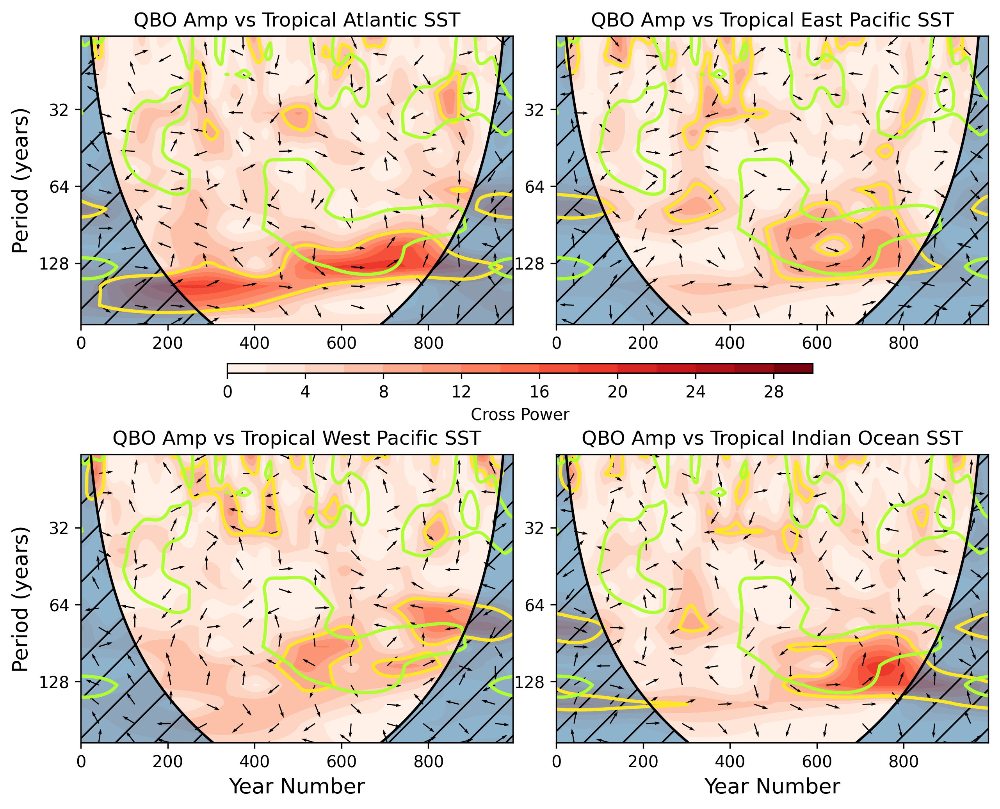

[[2.83618070e-12 3.10873291e-12 2.77143420e-12 ... 1.15128741e-11
  8.70782059e-12 5.94593416e-12]
 [1.42390726e-10 1.62996974e-10 1.48566203e-10 ... 6.30452584e-10
  4.92980396e-10 3.45845220e-10]
 [2.30348286e-09 2.68923930e-09 2.50314892e-09 ... 1.08831125e-08
  8.70066206e-09 6.28520387e-09]
 ...
 [5.72713451e-01 5.72733415e-01 5.72752903e-01 ... 5.71863010e-01
  5.71897287e-01 5.71931119e-01]
 [5.41939647e-03 5.42360633e-03 5.42771570e-03 ... 5.24006464e-03
  5.24729264e-03 5.25442678e-03]
 [1.08627261e-02 1.08627509e-02 1.08627750e-02 ... 1.08616715e-02
  1.08617140e-02 1.08617560e-02]]


In [25]:
def plot_cross_subfig(gs1, var, i, j, cross_power, phase_angle, time, result, result1, data1, sig95, extra_sig = []):
    ax2 = plt.subplot(gs1[j,i])

    phs_dt = round(len(time) / 12)
    tidx = np.arange(np.max(np.floor(phs_dt / 2)), len(time), phs_dt)
    tidx = [int(i) for i in tidx]
    tidx = np.array(tidx)
    phs_dp = round(len(result['period']) / 35)
    pidx = np.arange(
        np.max(np.floor(phs_dp / 2)), len(result['period']), phs_dp)
    pidx = [int(i) for i in pidx]
    pidx = np.array(pidx)
    X, Y = meshgrid(
        time.astype(np.int64)[tidx], np.log2(result['period'][pidx]))

    #Arrows indicate in phase when pointing to the right and out of phase when pointing left.
    phase_angle1 = phase_angle[:, tidx]
    phase_angle1 = phase_angle1[pidx, :]
    cA = np.exp(1j * phase_angle1)
    U = np.real(cA)
    V = np.imag(cA)
    # ax4.set_xlim(0.9,4.4)
    CS = ax2.contourf(time, np.log2(result['period']), np.abs(cross_power), master_levels, cmap = 'Reds')
    pc2 = ax2.contour(time, np.log2(result['period']), sig95,[-99, 1], linewidths=2)

    if len(extra_sig) == 0:
        p = 1
    else:
        ax2.contour(time, np.log2(result['period']), extra_sig,[-99, 1], linewidths=2, colors = 'greenyellow')
    # cone-of-influence , anything "below"is dubious
    ax2.plot(time, np.log2(result['coi']), 'k')
    ax2.set_title(var)
    ax2.fill_between(time, np.log2(result['coi']), int(
        np.log2(result['period'][-1]) + 1), alpha=0.5, hatch='/')
    #position = fig.add_axes([0.15, 0.40, 0.6, 0.01])
    # ,norm=normal)#,shrink=0.5,pad=0.08)
    #cbar = plt.colorbar(CS, cax=position, orientation='horizontal')
    #cbar.set_label('Power')
    Q = ax2.quiver(X.astype(np.int64), Y, U, V, linewidth=0.9, scale = 30)
    ax2.axis('tight')
    yt = (np.log2(result['period']))
    yt = range(int(np.log2(result['period'][0])), int(
        np.log2(result['period'][-1]) + 1))# create the vector of periods
    Yticks = [float(math.pow(2, p)) for p in yt]# make 2^periods
    Yticks = [int(i) for i in Yticks]
    ax2.set_yticks(yt)
    ax2.set_yticklabels(Yticks)
    ax2.set_ylim(ymin=(np.log2(result['period'][i1])), ymax=(
        np.log2(result['period'][i2])))
    ax2.invert_yaxis()
    if j == 1:
        ax2.set_xlabel('Year Number', fontsize=13)
    if i == 0:
        ax2.set_ylabel('Period (years)', fontsize=13)
    #ax2.axhline(y=10.5, xmin=0, xmax=1, linewidth=2, color='k')
    #ax2.axhline(y=13.3, xmin=0, xmax=1, linewidth=2, color='k')
    return CS

time = np.arange(1000)
i1 = 20
i2 = 35

Result_other = result_QBO_deep_amp_decadal
import matplotlib.gridspec as gridspec

def make_fig(title1, titles, result1, results, fname):
    fig = plt.figure(figsize=(10, 8), dpi = 300)
    gs1 = gridspec.GridSpec(2, 2)
    gs1.update(wspace=0.1, hspace=0.45)
    sig_SSWs = result_SSW_UKESM_DJFM_decadal['sig95']
    cross_power, coherence, phase_angle, sig95 = cross_wavelet(result1, results[0], time)
    pc = plot_cross_subfig(gs1, title1 + 'vs ' + titles[0], 0, 0, cross_power, phase_angle, time, results[0], result_flux_PC1_decadal, flux_pc1_decadal, sig95, sig_SSWs)
    cross_power, coherence, phase_angle, sig95 = cross_wavelet(result1, results[1], time)
    pc = plot_cross_subfig(gs1, title1 + 'vs ' + titles[1], 1, 0, cross_power, phase_angle, time, results[1], result_flux_PC1_decadal, flux_pc1_decadal, sig95, sig_SSWs)
    cross_power, coherence, phase_angle, sig95 = cross_wavelet(result1, results[2], time)
    pc = plot_cross_subfig(gs1, title1 + 'vs ' + titles[2], 0, 1, cross_power, phase_angle, time, results[0], result_flux_PC1_decadal, flux_pc1_decadal, sig95, sig_SSWs)
    cross_power, coherence, phase_angle, sig95 = cross_wavelet(result1, results[3], time)
    pc = plot_cross_subfig(gs1, title1 + 'vs ' + titles[3], 1, 1, cross_power, phase_angle, time, results[1], result_flux_PC1_decadal, flux_pc1_decadal, sig95, sig_SSWs)
    
        
    cax = fig.add_axes([0.25, 0.52, 0.5, 0.01])
    cbar = plt.colorbar(pc, label = 'Cross Power', orientation = 'horizontal', aspect=100, cax=cax)

    
    
    #cross_power, coherence, phase_angle, sig95 = cross_wavelet(result1, results[2], time)
    #plot_cross_subfig(title1 + 'vs ' + titles[2], 2, cross_power, phase_angle, time, results[3], result_flux_PC1_decadal, flux_pc1_decadal, sig95, other_sig)
    #cross_power, coherence, phase_angle, sig95 = cross_wavelet(results[0], results[1], time)
    #plot_cross_subfig(titles[0] + 'vs ' + titles[1], 3, cross_power, phase_angle, time, results[2], result_flux_PC1_decadal, flux_pc1_decadal, sig95, sig_SSWs)
    
    #ax1 = plt.subplot(gs1[0,0])
    #ax3 = plot_series(ax1, UKESM_DJFM_decadal, QBO_deep_amplitude_mod_decadal, time, title1 + 'vs ' + titles[0])

    #ax1 = plt.subplot(gs1[0,1])
    #ax3 = plot_series(ax1, UKESM_DJFM_decadal, AL_decadal, time, title1 + 'vs ' + titles[1])
    #ax3.set_ylabel('AL')
    #ax3.set_title('b) SSWs vs Dec-Mar Aleutian Low')

    
    plt.tight_layout()
    plt.show()
    fig.savefig(fname, dpi = 400)
    return


titles = ['Tropical Atlantic SST', 'Tropical East Pacific SST', 'Tropical West Pacific SST'
         , 'Tropical Indian Ocean SST']
results = [result_SST_TA, result_SST_TEP, result_SST_TWP, result_SST_TIO]
make_fig('QBO Amp ', titles, result_QBO_deep_amp_decadal, results, './Multi_decada_paper_figs/QBO_amp_vs_trop_SSTs_crosspower_new_levels.png')



(1001,) (1001,)


<ipython-input-46-205fc057ecf6>:84: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


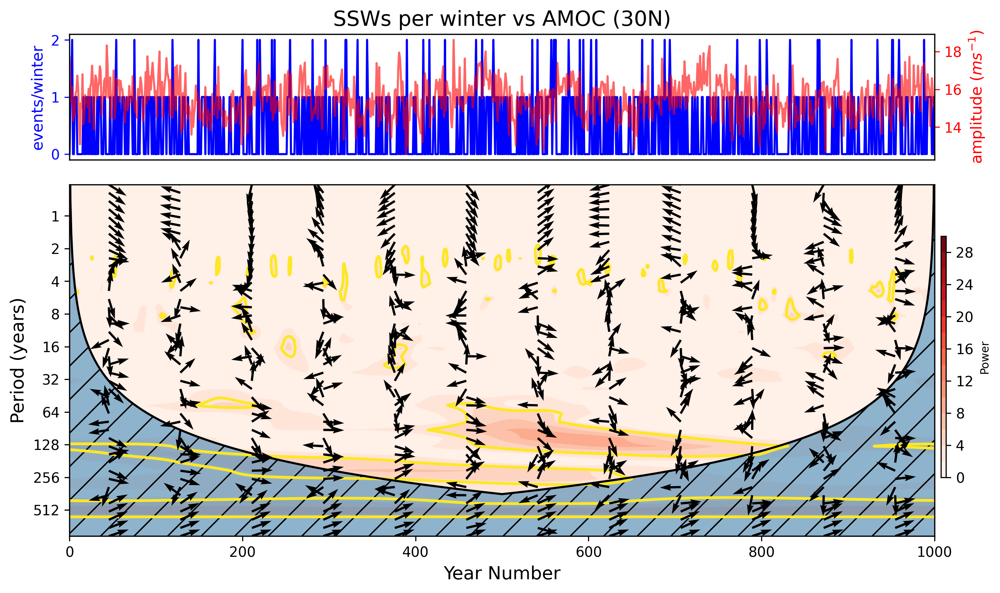

In [46]:
def plot_cross(var, cross_power, phase_angle, time, result, result1, data1, data2, sig95, figname, extra_sig = []):
    """ PLOT CROSS POWER
    cross_power = from cross_wavelet function
    coherence   = from cross_wavelet function
    """
    import matplotlib.gridspec as gridspec
    fig = plt.figure(figsize=(10, 6), dpi = 300)
    # set plot grid
    gs1 = gridspec.GridSpec(7, 1)
    ax1 = plt.subplot(gs1[0:2, 0])
    ax1 = pylab.gca()
    ax1.xaxis.set_visible(False)
    plt.setp(ax1.get_xticklabels(), visible=False)
    ax2 = plt.subplot(gs1[2:, 0])# axisbg='#C0C0C0')
    # plot timeseries
    ax1.plot(time, data2, color = 'b')
    ax1.set_ylabel('events/winter', fontsize=11)
    ax1.axis('tight')
    ax3 = ax1.twinx()
    ax3.plot(time, data1, color='r', alpha = 0.6)
    ax3.set_ylabel('amplitude ($ms^{-1}$)', fontsize=11)
    #ax3.set_ylabel()
    ax3.axis('tight')
    ax1.set_title('%s' % var, fontsize=15)
    ax1.yaxis.set_major_locator(MaxNLocator(prune='lower'))
    #ax1.grid(True)
    ax1.xaxis.set_visible(False)
    ax1.set_yticks([0,1,2])
    ax3.yaxis.label.set_color('r')
    ax1.yaxis.label.set_color('b')
    ax1.tick_params(axis='y', colors='b')
    ax3.tick_params(axis='y', colors='r')

    ax1.set_xlim(0,1000)
    
    phs_dt = round(len(time) / 12)
    tidx = np.arange(np.max(np.floor(phs_dt / 2)), len(time), phs_dt)
    tidx = [int(i) for i in tidx]
    tidx = np.array(tidx)
    phs_dp = round(len(result['period']) / 35)
    pidx = np.arange(
        np.max(np.floor(phs_dp / 2)), len(result['period']), phs_dp)
    pidx = [int(i) for i in pidx]
    pidx = np.array(pidx)
    X, Y = meshgrid(
        time.astype(np.int64)[tidx], np.log2(result['period'][pidx]))

    #Arrows indicate in phase when pointing to the right and out of phase when pointing left.
    phase_angle1 = phase_angle[:, tidx]
    phase_angle1 = phase_angle1[pidx, :]
    cA = np.exp(1j * phase_angle1)
    U = np.real(cA)
    V = np.imag(cA)
    ax4 = ax2.twiny()
    ax4.xaxis.set_visible(False)
    # ax4.set_xlim(0.9,4.4)
    CS = ax2.contourf(time, np.log2(result['period']), np.abs(cross_power), master_levels, cmap = 'Reds')
    pc2 = ax2.contour(time, np.log2(result['period']), sig95,[-99, 1], linewidths=2)
    if len(extra_sig) == 0:
        p = 1
    else:
        pc3 = ax2.contour(time, np.log2(result['period']), extra_sig,[-99, 1], linewidths=2, colors = 'greenyellow')
    # cone-of-influence , anything "below"is dubious
    ax2.plot(time, np.log2(result['coi']), 'k')
    ax2.fill_between(time, np.log2(result['coi']), int(
        np.log2(result['period'][-1]) + 1), alpha=0.5, hatch='/')
    position = fig.add_axes([0.94, 0.2, 0.005, 0.4])
    # ,norm=normal)#,shrink=0.5,pad=0.08)
    cbar = plt.colorbar(CS, cax = position, orientation='vertical')
    cbar.set_label('Power', fontsize = 8)
    Q = ax4.quiver(X.astype(np.int64), Y, U, V, linewidth=0.1)
    yt = (np.log2(result['period']))
    yt = range(int(np.log2(result['period'][0])), int(
        np.log2(result['period'][-1]) + 1))# create the vector of periods
    Yticks = [float(math.pow(2, p)) for p in yt]# make 2^periods
    Yticks = [int(i) for i in Yticks]
    ax2.set_yticks(yt)
    ax2.set_yticklabels(Yticks)
    ax2.set_ylim(ymin=(np.log2(result['period'][i1])), ymax=(
        np.log2(result['period'][i2])))
    ax2.set_xlabel('Year Number', fontsize=13)
    ax2.set_ylabel('Period (years)', fontsize=13)
    ax2.invert_yaxis()
    plt.tight_layout()
    plt.savefig(figname, dpi= 300)
    plt.show()
    return

i1 = 20
i2 = 35
i1 = 0
i2 = -1
time = np.arange(1001)

#cross_power, coherence, phase_angle, sig95 = cross_wavelet(result_SSW_UKESM_DJFM_decadal_lows, result_QBO_deep_amp_decadal, time)
#plot_cross('SSWs (low rate variability) vs deep QBO Amplitude', cross_power, phase_angle, time, result_SSW_UKESM_DJFM_decadal_lows, result_QBO_deep_amp_decadal, QBO_deep_amplitude_mod_decadal, SSW_decadal_low_var, sig95, './Multi_decada_paper_figs/cross_power_SSWs_low_rates_vs_QBO_amplitude_modulation_5yr_mean_new_levels.png', result_SSW_UKESM_DJFM_decadal['sig95'])
print(AL.shape, SSW_UKESM_DJFM_series.shape)
#cross_power, coherence, phase_angle, sig95 = cross_wavelet(result_SSW_UKESM_DJFM, result_AL, time)
#plot_cross('SSWs per winter vs Dec-Mar Aleutian Low', cross_power, phase_angle, time, result_SSW_UKESM_DJFM, result_AL, AL, SSW_UKESM_DJFM_series, sig95, './Multi_decada_paper_figs/cross_power_SSWs_vs_AL_new_levels.png')

cross_power, coherence, phase_angle, sig95 = cross_wavelet(result_SSW_UKESM_DJFM, result_AMOC, time)
plot_cross('SSWs per winter vs AMOC (30N)', cross_power, phase_angle, time, result_SSW_UKESM_DJFM, result_AMOC, AMOC, SSW_UKESM_DJFM_series, sig95, './Multi_decada_paper_figs/cross_power_SSWs_vs_AMOC.png')

#cross_power, coherence, phase_angle, sig95 = cross_wavelet(result_SSW_UKESM_DJFM_decadal, result_QBO_deep_amp_decadal, time)
#plot_cross('SSWs vs Sep-Nov $QBO_{deep}$ Amplitude Modulation', cross_power, phase_angle, time, result_SSW_UKESM_DJFM_decadal_lows, result_QBO_deep_amp_decadal, QBO_deep_amplitude_mod_decadal, sig95, './Multi_decada_paper_figs/cross_power_SSWs_vs_QBO_amplitude_modulation_5yr_mean.png', result_SSW_UKESM_DJFM_decadal['sig95'])
#cross_power, coherence, phase_angle, sig95 = cross_wavelet(result_SSW_UKESM_DJFM_decadal, result_AL_decadal, time)
#plot_cross('SSWs vs Dec-Mar Aleutian Low', cross_power, phase_angle, time, result_SSW_UKESM_DJFM_decadal_lows, result_QBO_deep_amp_decadal, AL_decadal, sig95, './Multi_decada_paper_figs/cross_power_SSWs_vs_AL_5yr_mean.png', result_SSW_UKESM_DJFM_decadal['sig95'])

#cross_power, coherence, phase_angle, sig95 = cross_wavelet(result_SSW_UKESM_DJFM_decadal, result_QBO_deep_amp_decadal, time)
#plot_cross('$SSW_{5yr}$ vs Sep-Nov QBO Amplitude Modulation', cross_power, phase_angle, time, result_SSW_UKESM_DJFM_decadal, result_QBO_deep_amp_decadal, QBO_deep_amplitude_mod_decadal, UKESM_DJFM_decadal, sig95, './Multi_decada_paper_figs/cross_power_SSWs_vs_QBO_amplitude_modulation_5yr_mean.png', result_SSW_UKESM_DJFM_decadal['sig95'])


#cross_power, coherence, phase_angle, sig95 = cross_wavelet(result_SSW_UKESM_DJFM_decadal, result_AL_decadal, time)
#plot_cross('$SSW_{5yr}$ vs Dec-Mar Aleutian Low', cross_power, phase_angle, time, result_SSW_UKESM_DJFM_decadal, result_AL_decadal, AL_decadal, UKESM_DJFM_decadal, sig95, './Multi_decada_paper_figs/cross_power_SSWs_vs_AL_5yr_mean.png', result_SSW_UKESM_DJFM_decadal['sig95'])


#cross_power, coherence, phase_angle, sig95 = cross_wavelet(result_ENSO_SON, result_QBO_deep_amp_decadal, time)
#plot_cross('ENSO3.4 vs deep QBO Amplitude', cross_power, phase_angle, time, result_ENSO_SON, result_QBO_deep_amp_decadal, QBO_deep_amplitude_mod_decadal, ENSO_SON_decadal, sig95, './Multi_decada_paper_figs/cross_power_ENSO_vs_deep_QBO_amp_5yr_mean_new_levels.png', result_SSW_UKESM_DJFM_decadal['sig95'])



In [366]:
import scipy
print(scipy.stats.pearsonr(AL[0:-1], SSW_UKESM_DJFM_series))

(-0.20616652321416168, 4.532363608900183e-11)


<ipython-input-137-4c9015e4dcdb>:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad = 1)


<Figure size 3000x2700 with 0 Axes>

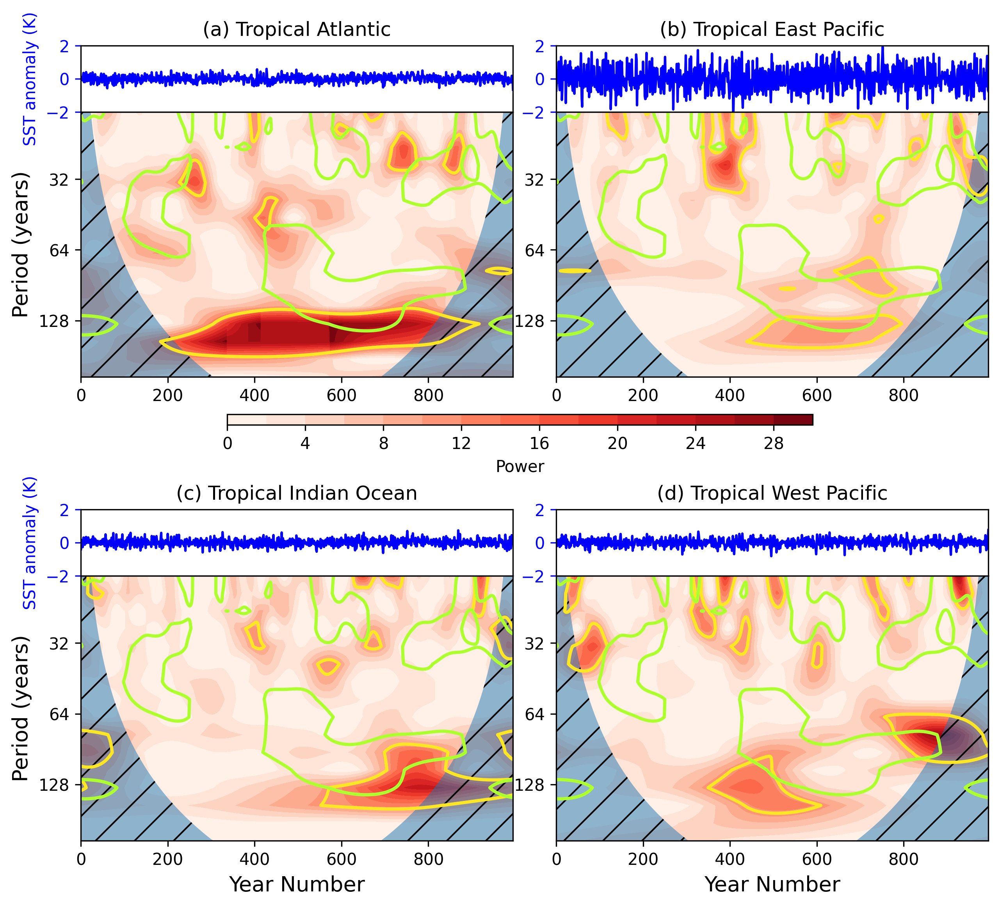

In [137]:
fig = plt.figure(figsize=(10, 9), dpi = 300)
def plot_subfig(gs, var, i, j, time, result, extra_sig = [], fig = fig):
    ax2 = plt.subplot(gs[1,0])

    """ Contour plot wavelet power spectrum """
    #lev = np.arange(15)#np.min(result['power']), np.max(result['power']))
    pc = ax2.contourf(time, np.log2(result['period']), result['power'], master_levels, cmap = 'Reds')
    pc2 = ax2.contour(time, np.log2(result['period']), result['sig95'],[-99, 1], linewidths=2)
    extra_sig = result_SSW_UKESM_DJFM_decadal['sig95']
    #ax2.contour(time, np.log2(result['period']), extra_sig,[-99, 1], linewidths=2, colors = 'greenyellow')
    #ax2.plot(time, np.log2(result['coi']), 'k')
    # cone-of-influence , anything "below"is dubious
    ax2.fill_between(time, np.log2(result['coi']), int(np.log2(result['period'][-1]) + 1), alpha=0.5, hatch='/')

    yt = (np.log2(result['period']))
    yt = range(int(np.log2(result['period'][0])), int(
        np.log2(result['period'][-1]) + 1))# create the vector of periods
    Yticks = [float(math.pow(2, p)) for p in yt]# make 2^periods
    Yticks = [int(i) for i in Yticks]
    ax2.set_yticks(yt)
    ax2.set_yticklabels(Yticks)
    ax2.set_ylim(ymin=(np.log2(result['period'][i1])), ymax=(
        np.log2(result['period'][i2])))
    pc3 = ax2.contour(time, np.log2(result['period']), extra_sig,[-99, 1], linewidths=2, colors = 'greenyellow')

    ax2.invert_yaxis()
              
    ax2.set_xlabel('Year Number', fontsize=13)
    if j == 1:
        #ax2.xaxis.set_visible(False)
        #ax2.set_xticklabels([' ',' ', ' ',' ',' '])
        ax2.set_xlabel(' ')
    if i == 0:
        ax2.set_ylabel('Period (years)', fontsize=13)
    

    return pc


def plot_series(ax1, s1, time, var):
    ax1.xaxis.set_visible(False)
    plt.setp(ax1.get_xticklabels(), visible=False)
    # plot timeseries
    ax1.plot(time, s1, color = 'b')
    ax1.set_ylabel('')
    ax1.axis('tight')
    ax1.set_title(var)
    ax1.yaxis.set_major_locator(MaxNLocator(prune='lower'))
    #ax1.grid(True)
    ax1.xaxis.set_visible(False)
    ax1.yaxis.label.set_color('b')
    ax1.tick_params(axis='y', colors='b')
    ax1.set_xlim(time[0], time[-1])
    ax1.set_ylim(-2,2)
    ax1.set_yticks([-2, 0, 2])

    return ax1

time = np.arange(996)
time1001 = np.arange(1002)

i1 = 20
i2 = 35

Result_other = result_QBO_deep_amp_decadal
import matplotlib.gridspec as gridspec

other_sig = result_SSW_UKESM_DJFM_decadal['sig95']
def make_fig(result, titles, fname):
    fig = plt.figure(figsize=(10, 9), dpi = 300)
    
    outer = gridspec.GridSpec(2, 2)
    outer.update(wspace=0.1, hspace=0.4)

    #make nested gridspecs
    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec = outer[0,0], height_ratios = [1, 4], hspace = 0)
    
    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec = outer[0,1], height_ratios = [1, 4], hspace = 0)

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec = outer[1,0], height_ratios = [1, 4], hspace = 0)

    gs4 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec = outer[1,1], height_ratios = [1, 4], hspace = 0)

    sig_SSWs = result_SSW_UKESM_DJFM_decadal['sig95']
    pc = plot_subfig(gs1, var, 0, 1, time, result[0], extra_sig = sig_SSWs)
    pc = plot_subfig(gs2, var, 1, 1, time, result[1], extra_sig = sig_SSWs)
    pc = plot_subfig(gs3, var, 0, 5, time, result[2], extra_sig = sig_SSWs)
    pc = plot_subfig(gs4, var, 1, 5, time, result[3], extra_sig = sig_SSWs)
    

    ax1 = plt.subplot(gs1[0,0])
    ax3 = plot_series(ax1, SST_TA, time1001, titles[0])
    ax1.set_ylabel('SST anomaly (K)')

    ax1 = plt.subplot(gs2[0,0])
    ax3 = plot_series(ax1, SST_TEP, time1001, titles[1])

    ax1 = plt.subplot(gs3[0,0])
    ax3 = plot_series(ax1, SST_TIO, time1001, titles[2])
    ax1.set_ylabel('SST anomaly (K)')

    ax1 = plt.subplot(gs4[0,0])
    ax3 = plot_series(ax1, SST_TWP, time1001, titles[3])

    cax = fig.add_axes([0.25, 0.52, 0.5, 0.01])
    cbar = plt.colorbar(pc, label = 'Power', orientation = 'horizontal', aspect=100, cax=cax)

    
    plt.tight_layout(pad = 1)
    plt.show()
    fig.savefig(fname, dpi = 400)
    return


result_SST_TA['power'][result_SST_TA['power'] >= 29] = 26
titles = ['(a) Tropical Atlantic', '(b) Tropical East Pacific', '(c) Tropical Indian Ocean', '(d) Tropical West Pacific']
make_fig([result_SST_TA, result_SST_TEP, result_SST_TIO, result_SST_TWP],  titles, './Multi_decada_paper_figs/SSTs_tropical_wavelet_new_levels.png')


In [249]:
def plot_subfig(gs, data1, var, i, j, time, result, fig, extra_sig = []):
    ax2 = plt.subplot(gs[1,0])

    """ Contour plot wavelet power spectrum """
    #lev = np.arange(15)#np.min(result['power']), np.max(result['power']))
    pc = ax2.contourf(time, np.log2(result['period']), result['power']*s2, master_levels, cmap = 'Reds')
    pc2 = ax2.contour(time, np.log2(result['period']), result['sig95']*s,[-99, 1], linewidths=2)
    extra_sig = result_NAM['sig95']
    #ax2.contour(time, np.log2(result['period']), extra_sig,[-99, 1], linewidths=2, colors = 'greenyellow')
    #ax2.plot(time, np.log2(result['coi']), 'k')
    # cone-of-influence , anything "below"is dubious
    ax2.fill_between(time, np.log2(result['coi']), int(np.log2(result['period'][-1]) + 1), alpha=0.5, hatch='/')

    yt = (np.log2(result['period']))
    yt = range(int(np.log2(result['period'][0])), int(
        np.log2(result['period'][-1]) + 1))# create the vector of periods
    Yticks = [float(math.pow(2, p)) for p in yt]# make 2^periods
    Yticks = [int(i) for i in Yticks]
    ax2.set_yticks(yt)
    ax2.set_yticklabels(Yticks)
    ax2.set_ylim(ymin=(np.log2(result['period'][i1])), ymax=(
        np.log2(result['period'][i2])))
    #pc3 = ax2.contour(time, np.log2(result['period']), extra_sig,[-99, 1], linewidths=2, colors = 'greenyellow')

    ax2.invert_yaxis()
              
    ax2.set_xlabel('Year Number')
    if i == 0:
        ax2.set_ylabel('Period (years)')
    

    return pc


def plot_cross_subfig(ax2, cross_power, phase_angle, time, result, result1, data1, data2, sig95, extra_sig = []):
    var_product = np.std(data1)*np.std(data2)
    phs_dt = round(len(time) / 12)
    tidx = np.arange(np.max(np.floor(phs_dt / 2)), len(time), phs_dt)
    tidx = [int(i) for i in tidx]
    tidx = np.array(tidx)
    phs_dp = round(len(result['period']) / 35)
    pidx = np.arange(
        np.max(np.floor(phs_dp / 2)), len(result['period']), phs_dp)
    pidx = [int(i) for i in pidx]
    pidx = np.array(pidx)
    X, Y = meshgrid(
        time.astype(np.int64)[tidx], np.log2(result['period'][pidx]))
    
    
    smoothed_NAM_events = pickle.load(open('./NAMs/NAM_smoothed_events_for_plotting', 'rb'))
    strongs = smoothed_NAM_events[0]
    weaks = smoothed_NAM_events[1]
    
    #Arrows indicate in phase when pointing to the right and out of phase when pointing left.
    phase_angle1 = phase_angle[:, tidx]
    phase_angle1 = phase_angle1[pidx, :]
    cA = np.exp(1j * phase_angle1)
    U = np.real(cA)
    V = np.imag(cA)
    # ax4.set_xlim(0.9,4.4)
    lev = np.arange(0,500,50)
    CS = ax2.contourf(time, np.log2(result['period']), np.abs(cross_power)*c2, master_levels, cmap = 'Reds')
    pc2 = ax2.contour(time, np.log2(result['period']), sig95*c,[-99, 1], linewidths=2)

    if len(extra_sig) == 0:
        p = 1
        

    #else:
        #ax2.contour(time, np.log2(result['period']), extra_sig,[-99, 1], linewidths=2, colors = 'greenyellow')
    # cone-of-influence , anything "below"is dubious
    ax2.plot(time, np.log2(result['coi']), 'k')
    #ax2.set_title(var)
    ax2.fill_between(time, np.log2(result['coi']), int(
        np.log2(result['period'][-1]) + 1), alpha=0.5, hatch='/')
    #position = fig.add_axes([0.15, 0.40, 0.6, 0.01])
    # ,norm=normal)#,shrink=0.5,pad=0.08)
    #cbar = plt.colorbar(CS, cax=position, orientation='horizontal')
    #cbar.set_label('Power')
    Q = ax2.quiver(X.astype(np.int64), Y, U, V, linewidth=0.9, scale = 30)
    ax2.axis('tight')
    yt = (np.log2(result['period']))
    yt = range(int(np.log2(result['period'][0])), int(
        np.log2(result['period'][-1]) + 1))# create the vector of periods
    Yticks = [float(math.pow(2, p)) for p in yt]# make 2^periods
    Yticks = [int(i) for i in Yticks]
    ax2.set_yticks(yt)
    ax2.set_yticklabels(Yticks)
    ax2.set_ylim(ymin=(np.log2(result['period'][i1])), ymax=(
        np.log2(result['period'][i2])))
    ax2.invert_yaxis()
    ax2.set_xlabel('Year Number')
    #ax2.scatter(np.array(strongs) - 2060, np.log2(result['period'][int(i2-i1/2)])*np.ones(len(strongs)), color = 'white', s =3)
    #ax2.scatter(np.array(weaks) - 2060, np.log2(result['period'][int(i2-i1/2)])*np.ones(len(weaks)), color = 'black', s = 3)
        #ax2.set_ylabel('Period (years)', fontsize=13)
    #ax2.axhline(y=10.5, xmin=0, xmax=1, linewidth=2, color='k')
    #ax2.axhline(y=13.3, xmin=0, xmax=1, linewidth=2, color='k')
    return CS


def plot_series(ax1, s1, lim1, lim2, time, c, titles, extra = False, s2 = None, other = False):
    ax1.xaxis.set_visible(False)
    plt.setp(ax1.get_xticklabels(), visible=False)
    # plot timeseries
    ax1.plot(time, s1, color = c, linewidth = 0.6)
    ax1.set_ylabel('')
    ax1.axis('tight')
    #ax1.set_title(var)
    ax1.yaxis.set_major_locator(MaxNLocator(prune='lower'))
    #ax1.grid(True)
    ax1.xaxis.set_visible(False)
    #ax1.yaxis.label.set_color('b')
    #ax1.tick_params(axis='y', colors='b')
    ax1.set_xlim(time[0], time[-1])


    #ax1.set_yticks([15, 25, 35])
    if extra == True:
        ax3 = ax1.twinx()
        ax3.plot(time, s2, color='r', alpha = 0.6)
        ax3.set_ylabel(titles[3], fontsize=11)
        #ax3.set_ylabel()
        ax3.axis('tight')
        ax1.yaxis.set_major_locator(MaxNLocator(prune='lower'))
        #ax1.grid(True)
        ax1.xaxis.set_visible(False)
        ax3.set_xlim(time[0], time[-1])
        ax3.set_ylim(lim2[0],lim2[-1]*1.05)
        #ax3.set_yticks([-0.5,0,0.5])
        ax3.yaxis.label.set_color('r')
        ax1.yaxis.label.set_color('b')
        ax1.tick_params(axis='y', colors='b')
        ax3.tick_params(axis='y', colors='r')
        ax1.set_ylim(15,37)
        ax1.set_yticks([15,25,35])
        if other == True:        
            ax3.set_yticks(np.linspace(int(np.min(s2)), int(np.max(s2)), 3))
            ax3.set_ylim(np.min(s2), np.max(s2))
            ax3.set_ylabel('Sv')

    ax1.set_ylim(lim1[0],lim1[-1]*1.05)
    ax1.set_yticks(lim1)
    return ax1


def global_spectra(ax5, result, global_lim):
    """ Plot global wavelet spectrum """
    #f, sxx = fft(data)
    #ax5.plot(sxx, np.log2(1 / f * result['dt']), 'gray', label='Fourier spectrum')
    ax5.plot(result['global_ws'], np.log2(result['period']), 'b', label='Wavelet spectrum')
    ax5.plot(np.array(result['global_signif'])*g, np.log2(result['period']), 'r--', label='95% confidence spectrum')
    #ax5.legend(loc=0)
    #ax5.set_yticks(yt[1:])
    ax5.yaxis.tick_right()
    ax5.yaxis.set_label_position("right")

    ax5.set_xlim(0, 1.05 * np.max(result['global_signif'][i1:i2]))
    gticks = np.ceil(np.linspace(0, 1.05 * np.max(result['global_signif'][i1:i2]), 4))
    ax5.set_xticks(gticks)# int(1.3 * np.max(result['global_ws'][i1:i2])), 3))
    ax5.set_xlim(0,global_lim)# 1.05 * np.max(result['global_signif'][i1:i2]))
    ax5.set_xlabel('Power', fontsize=10)
    #ax5.set_ylabel('Period (years)', fontsize=10)

    yt = (np.log2(result['period']))
    yt = range(int(np.log2(result['period'][0])), int(
        np.log2(result['period'][-1]) + 1))# create the vector of periods
    Yticks = [float(math.pow(2, p)) for p in yt]# make 2^periods
    Yticks = [int(i) for i in Yticks]
    ax5.set_yticks(yt)
    ax5.set_yticklabels(Yticks, visible = False)
    ax5.set_ylim(ymin=(np.log2(result['period'][i1])), ymax=(
        np.log2(result['period'][i2])))
    ax5.invert_yaxis()
    #ax5.set_title('Global Wavelet Spectrum', fontsize=12)
    return

import matplotlib.gridspec as gridspec

def make_wave_and_cross_fig(result1, data1, lim1, lim2, result_SSW, data_SSW, titles, global_lim, fname, other = False):
    fig = plt.figure(figsize=(12, 4), dpi = 200)
    
    outer = gridspec.GridSpec(1, 2)
    outer.update(wspace=0.11, hspace=0.4)

    #make nested gridspecs
    gs1 = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec = outer[0,0], height_ratios = [1, 4], width_ratios = [4, 1], hspace = 0, wspace = 0)
    
    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec = outer[0,1], height_ratios = [1, 4], hspace = 0)

    #gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec = outer[1,0], height_ratios = [1, 4], hspace = 0)

    #gs4 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec = outer[1,1], height_ratios = [1, 4], hspace = 0)

    sig_SSWs = result_SSW_UKESM_DJFM_decadal['sig95']
    
    #wavelet spectra axis
    pc = plot_subfig(gs1, data1, var, 0, 1, time, result1, fig, extra_sig = sig_SSWs)
    ax5 = plt.subplot(gs1[1,1])
    global_spectra(ax5, result1, global_lim)
    
    
    #cross power axis
    cross_power, coherence, phase_angle, sig95 = cross_wavelet(result_SSW, result1, time)
    ax2 = plt.subplot(gs2[1,0])
    CS = plot_cross_subfig(ax2, cross_power, phase_angle, time, result1, result_SSW, data1, data_SSW, sig95, extra_sig = result_NAM['sig95'])

    #plot series
    ax1 = plt.subplot(gs1[0,0])
    ax3 = plot_series(ax1, data1, lim1, lim2, time, 'b', titles)
    ax1.set_ylabel(titles[1])
    ax1.set_title(titles[0])
    ax1 = plt.subplot(gs2[0,0])
    ax3 = plot_series(ax1, data1, lim1, lim2, time, 'b', titles, extra = True, s2 = data_SSW, other=other)
    ax1.set_title(titles[2])
    ax1.set_ylabel(titles[1])
 
    #add colorbar
    fig.subplots_adjust(bottom=0.2) # or whatever
    cax = fig.add_axes([0.27, 0.06, 0.5, 0.02])
    plt.colorbar(CS, cax = cax, orientation = 'horizontal')
    plt.tight_layout(pad = 1)
    plt.show()
    fig.savefig(fname, dpi = 500)
    return

master_levels = np.arange(0,32,2)

i1 = 20
i2 = -6
s = 1
time = np.arange(996)
time1001 = np.arange(1001)

(1000,)


<ipython-input-249-1d426d68e0dc>:221: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad = 1)


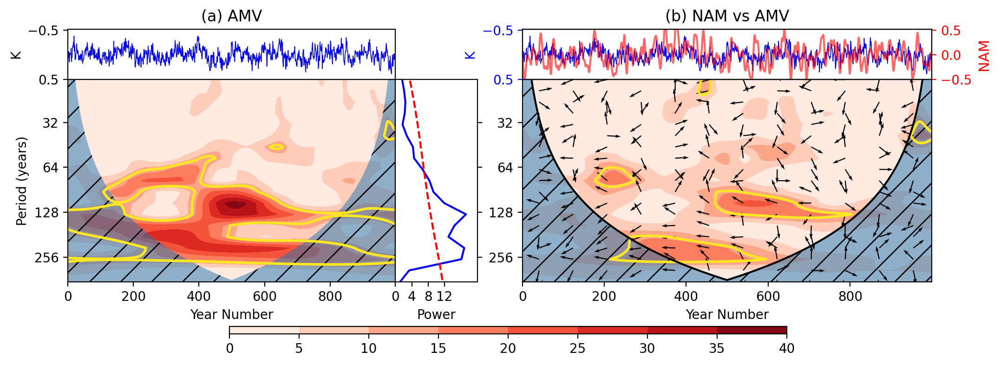

<ipython-input-249-1d426d68e0dc>:221: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad = 1)


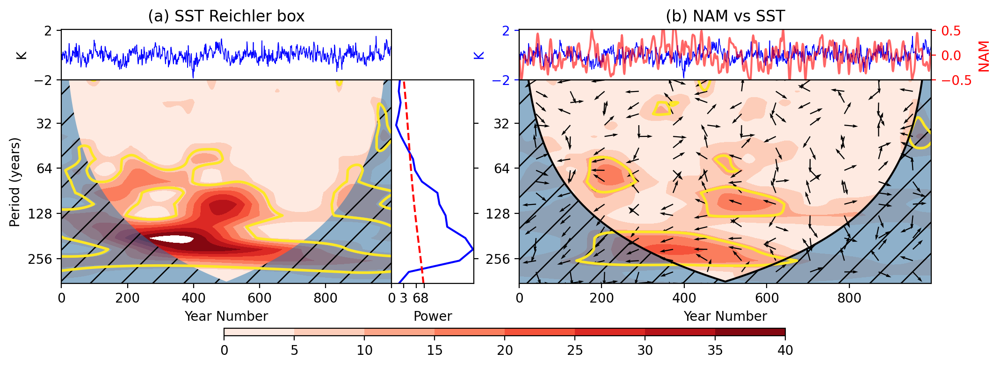

In [330]:
#make_wave_and_cross_fig(result_QBO_deep_amp_decadal, QBO_deep_amplitude_mod_decadal, result_SSW_UKESM_DJFM_decadal, UKESM_DJFM_decadal, ['(A) Sep-Nov deep QBO Amplitude', 'QBO amp','(B) $SSW_{5yr}$ vs deep QBO Amplitude'], './Multi_decada_paper_figs/deep_QBO_wavelet_combined.png')
#s = 1
#c = 0.1
import math
master_levels = np.arange(0,45,5)
time = np.arange(1000)
s=1
c= 0.9
g = 1
s2 = 1
c2 = 1
Max = math.ceil(np.max(AMOC))
Min = math.floor(0.95*np.min(AMOC))
Max2 = 0.5
Min2 = -0.5
#make_wave_and_cross_fig(result_AMOC, AMOC, [Min, Max], [Min2, Max2], result_NAM_filtered, NAM_filtered, ['(a) AMOC 45N', 'Sv','(b) NAM vs AMOC', 'NAM'], 12, 'AMOC_NAM_filtered_subplot.png')

print(AMV_DJF.shape)
Max = math.ceil(np.max(AMV_DJF))
Min = math.floor(0.95*np.min(AMV_DJF))
Max2 = 0.5
Min2 = -0.5
s2 = 1
c= 0.6
s = 1
make_wave_and_cross_fig(result_AMV, AMV_DJF, [0.5, -0.5], [Min2, Max2], result_NAM_filtered, NAM_filtered, ['(a) AMV', 'K','(b) NAM vs AMV', 'NAM'], 20, 'AMV_NAM_filtered_subplot.png')
make_wave_and_cross_fig(result_SST_reichler, SST_reichler, [-2, 2], [Min2, Max2], result_NAM_filtered, NAM_filtered, ['(a) SST Reichler box', 'K','(b) NAM vs SST', 'NAM'], 20, 'reichler_SST_NAM_filtered_subplot.png')


Max2 = 18
Min2 = 12
Max = math.ceil(np.max(flux_lab_sea))
Min = math.floor(0.95*np.min(flux_lab_sea))
#make_wave_and_cross_fig(result_flux_lab_sea, flux_lab_sea, [Min, Max], [Min2, Max2], result_AMOC, AMOC, ['(a) Dec-Mar Labrador Sea Heat Flux', '$Wm^{-2}$','(b) Flux vs AMOC', 'Sv'], 30, 'lab_flux_AMOC_filtered_subplot.png')


s=1
c= 0.8
g = 1
Max2 = 2.5
Min2 = -2.5

#make_wave_and_cross_fig(result_flux_lab_sea, flux_lab_sea, [Min, Max], [Min2, Max2], result_NAO, NAO, ['(a) Dec-Mar Labrador Sea Heat Flux', '$Wm^{-2}$','(b) Flux vs NAO', 'NAO'], 30, 'lab_flux_NAO_filtered_subplot.png')


<ipython-input-303-cd2dbf090d93>:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad = 1)


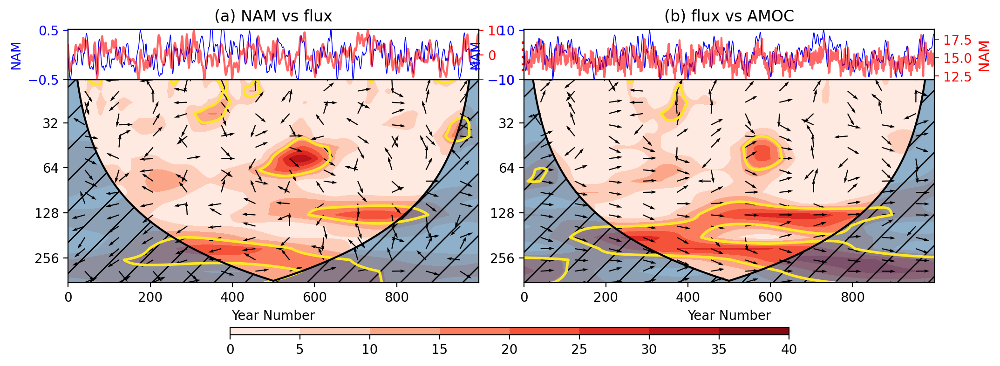

<ipython-input-303-cd2dbf090d93>:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad = 1)


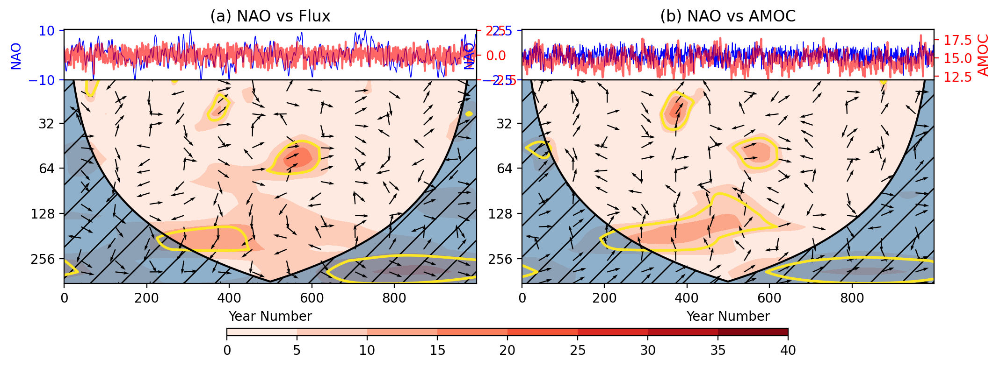

In [303]:
def make_cross_and_cross_fig(result1, data1, lims1, result2, data2, lims2,
                              result3, data3, lims3, titles, fname, other = False):
    fig = plt.figure(figsize=(12, 4), dpi = 200)
    
    outer = gridspec.GridSpec(1, 2)
    outer.update(wspace=0.11, hspace=0.4)

    #make nested gridspecs
    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec = outer[0,0], height_ratios = [1, 4], hspace = 0)
    
    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec = outer[0,1], height_ratios = [1, 4], hspace = 0)

    sig_SSWs = result_SSW_UKESM_DJFM_decadal['sig95']
    
    #cross power axis
    cross_power, coherence, phase_angle, sig95 = cross_wavelet(result1, result2, time)
    ax2 = plt.subplot(gs1[1,0])
    CS = plot_cross_subfig(ax2, cross_power, phase_angle, time, result1, result2, data1, data2, sig95, extra_sig = result_NAM['sig95'])

    #cross power axis
    cross_power, coherence, phase_angle, sig95 = cross_wavelet(result2, result3, time)
    ax2 = plt.subplot(gs2[1,0])
    CS = plot_cross_subfig(ax2, cross_power, phase_angle, time, result2, result3, data2, data3, sig95, extra_sig = result_NAM['sig95'])

    #plot series
    ax1 = plt.subplot(gs1[0,0])
    ax3 = plot_series(ax1, data1, lims1, lims2, time, 'b', titles, extra = True, s2 = data2, other=other)
    ax1.set_ylabel(titles[1])
    ax1.set_title(titles[0])
    ax1 = plt.subplot(gs2[0,0])
    ax3 = plot_series(ax1, data2, lims2, lims3, time, 'b', titles, extra = True, s2 = data3, other=other)
    ax1.set_title(titles[2])
    ax1.set_ylabel(titles[1])
 
    #add colorbar
    fig.subplots_adjust(bottom=0.2) # or whatever
    cax = fig.add_axes([0.27, 0.06, 0.5, 0.02])
    plt.colorbar(CS, cax = cax, orientation = 'horizontal')
    plt.tight_layout(pad = 1)
    plt.show()
    fig.savefig(fname, dpi = 500)
    return

c2 = 1

make_cross_and_cross_fig(result_NAM_filtered, NAM_filtered, [-0.5,0.5], result_flux_lab_sea, flux_lab_sea, [-10, 10],
                            result_AMOC, AMOC, [12,18], ['(a) NAM vs flux', 'NAM','(b) flux vs AMOC', 'NAM', 
                                                         '$Wm^{-2}$', 'Sv'], 'NAM_flux_AMOC_cross.png', other = False)
c2 = 1.5

make_cross_and_cross_fig(result_flux_lab_sea, flux_lab_sea, [-10, 10], result_NAO, NAO, [-2.5, 2.5],
                            result_AMOC, AMOC, [12,18], ['(a) NAO vs Flux', 'NAO','(b) NAO vs AMOC', 'AMOC'], 
                            'Flux_NAO_AMOC.png', other = False)

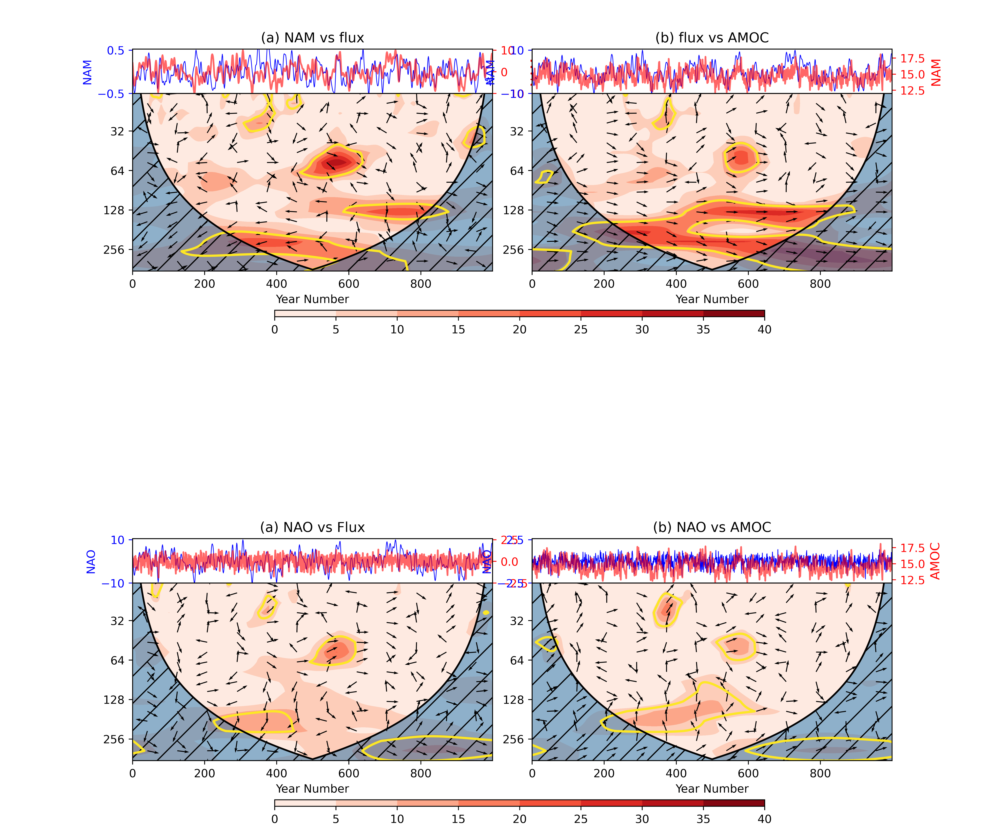

In [275]:
import matplotlib.image as mpimg
img1 = mpimg.imread('NAM_flux_AMOC_cross.png')
img2 = mpimg.imread('Flux_NAO_AMOC.png')

fig = plt.figure(figsize=(10, 10), dpi = 500)
gs1 = gridspec.GridSpec(2, 1)

ax = plt.subplot(gs1[0,0])
plt.axis('off')
plt.imshow(img1)

ax = plt.subplot(gs1[1,0])
plt.axis('off')
plt.imshow(img2)

gs1.update(wspace=0, hspace = 0)
plt.tight_layout()
plt.show()
fig.savefig('crosses_combined.png', dpi = 600)
